<a href="https://colab.research.google.com/github/jlkohn23/datasciencecoursera/blob/main/sea_ice_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 38.6 MB/s eta 0:00:00


In [2]:
import rasterio

In [3]:
pip install descartes

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import os
import time
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm, trange
import cv2

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label, binary_dilation, binary_erosion, reconstruction
from skimage.measure import regionprops, regionprops_table
from skimage import measure
from skimage.segmentation import watershed

from shapely.geometry import Polygon, LineString
from shapely.affinity import scale
from descartes import PolygonPatch

import scipy.ndimage as ndi
import scipy.interpolate

import tensorflow as tf

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from tensorflow.keras.layers import Lambda, RepeatVector, Reshape
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img

from glob import glob

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Trying using open cv - cv.imshow does not work in colab, must use google patch with cv2_imshow. We load the image with GDAL to maintain georeference capabilities.

In [6]:
img_path = '/content/gdrive/MyDrive/Exports/Final_p10_168/c168_SHIFT_p10_Clip.tif'
mask_path = '/content/gdrive/MyDrive/Exports/Binary_Raster/pond_raster_tiff.tif'

In [7]:
img = cv2.imread(img_path, cv2.IMREAD_LOAD_GDAL)
mask = cv2.imread(mask_path, cv2.IMREAD_LOAD_GDAL)

In [8]:
from google.colab.patches import cv2_imshow


Open CV defaults to reading a BGR image, therefore the displayed image of our ice is defaulted to the first three channels (band 1, band 2, and band 3).

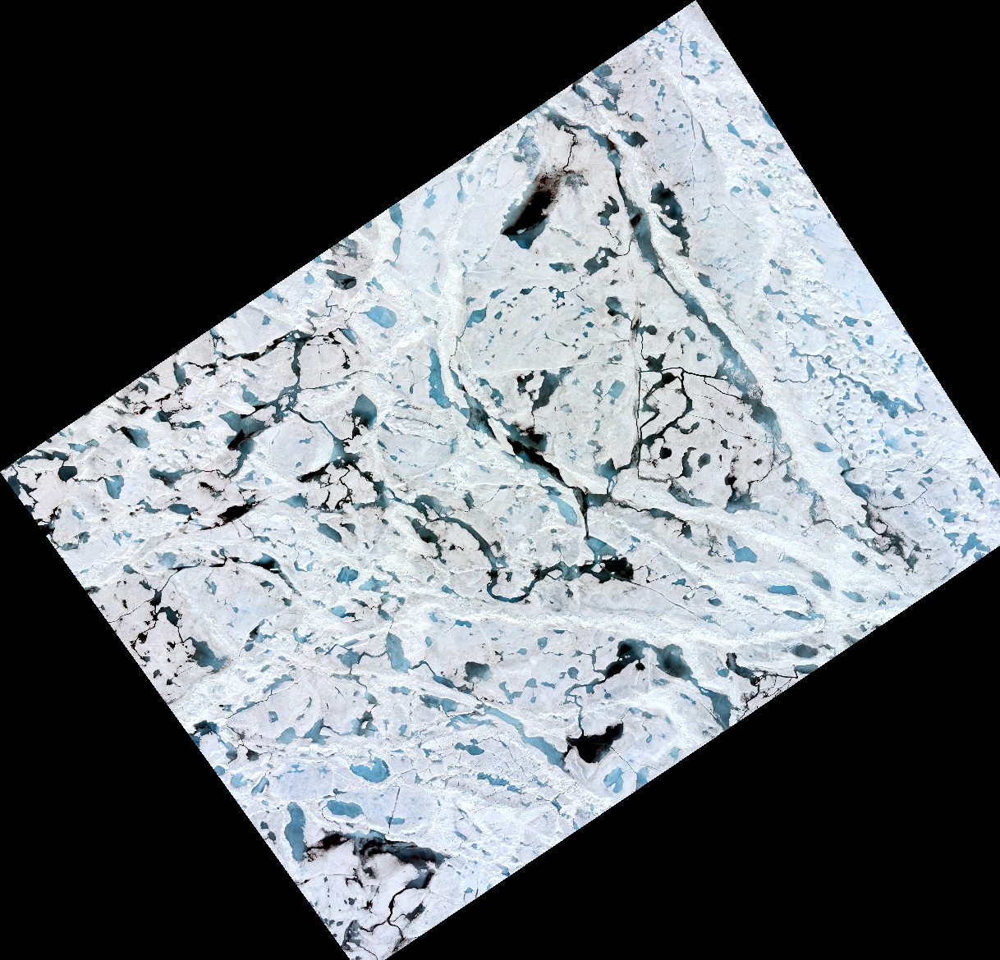

In [9]:
cv2_imshow(img)

We can see that our array shape includes 4 channels, where the fourth band represents the NIR.

In [10]:
img.shape

(1170, 1218, 4)

We now try to load the mask raster.

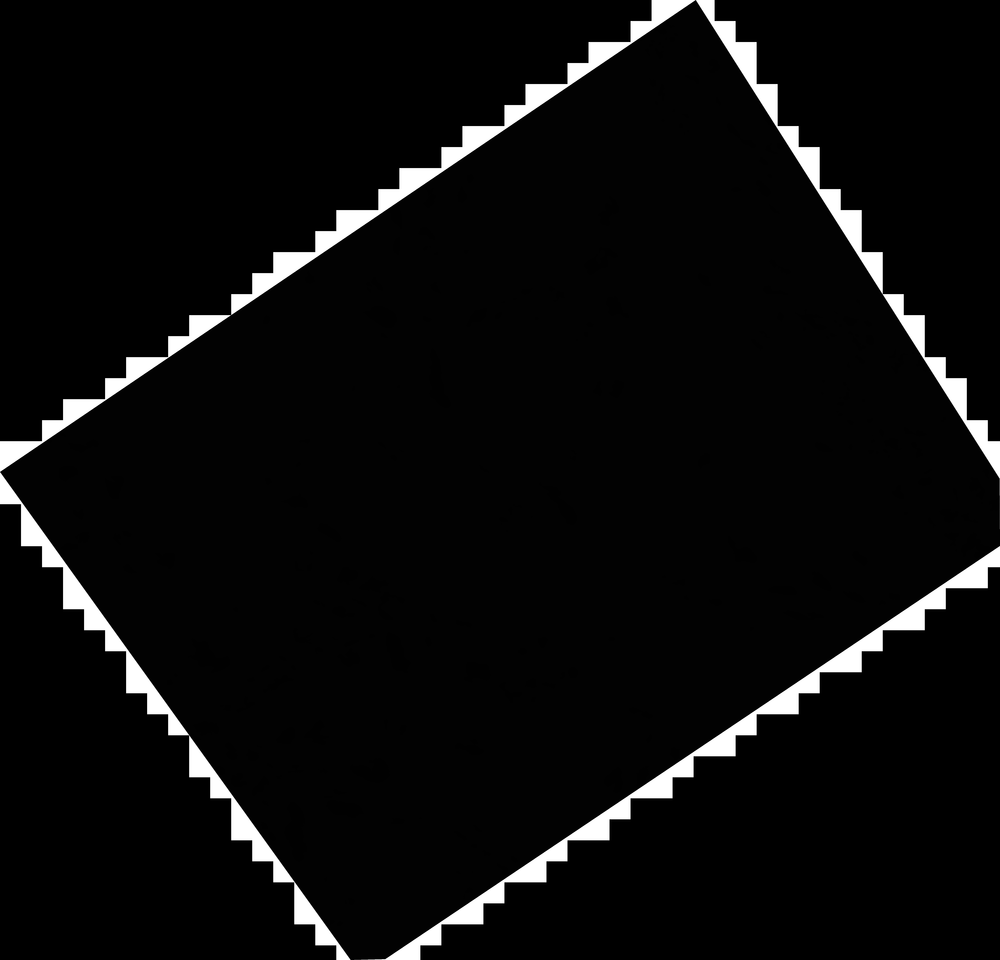

In [11]:
cv2_imshow(mask)

In [12]:
mask.shape

(5849, 6090)

In [13]:
img.shape

(1170, 1218, 4)

We see that the mask shape is much larger than the image shape. This is because the mask was originally generated on a full size tiff of the image, however, for modeling puposes we are using a p10 version of this image to conserve computational resources. The mask must be resized first to match our p10 image size.

In [14]:
mask_resize = cv2.resize(mask, None, fx=img.shape[0]/mask.shape[0], fy=img.shape[1]/mask.shape[1], interpolation = cv2.INTER_NEAREST)

In [15]:
mask_resize.shape

(1170, 1218)

In [16]:
img.shape

(1170, 1218, 4)

In [17]:
np.unique(mask_resize)

array([  0,   1,   2, 255], dtype=uint8)

The mask is reading as 4 distinct values, however we are only concerned with values 1 and 2, which represent our pond outlines and ice (non-pond) respectively. We create a binary array of our mask to represent this.

In [18]:
mask_bin = np.empty((mask_resize.shape[0], mask_resize.shape[1]))
mask_bin[:] = np.nan

In [19]:
mask_bin[np.where(mask_resize == 1)] = 1 #convert all ponds to white

In [20]:
mask_bin[np.where(mask_resize == 2)] = 0 #convert all ice to black

In [21]:
np.unique(mask_bin)

array([ 0.,  1., nan])

For display purposes, we create a 3 channel grey mask in cv2 by setting all nodata values to 0, ice values to 100, and pond values to 255.

In [22]:
grey_3_channel_mask = mask_resize.copy()
grey_3_channel_mask[grey_3_channel_mask == 255] = 0 #no data
grey_3_channel_mask[grey_3_channel_mask == 1] = 255 #ponds
grey_3_channel_mask[grey_3_channel_mask == 2] = 100 #ice

In [23]:
grey_3_channel_mask = cv2.cvtColor(grey_3_channel_mask, cv2.COLOR_GRAY2BGR)

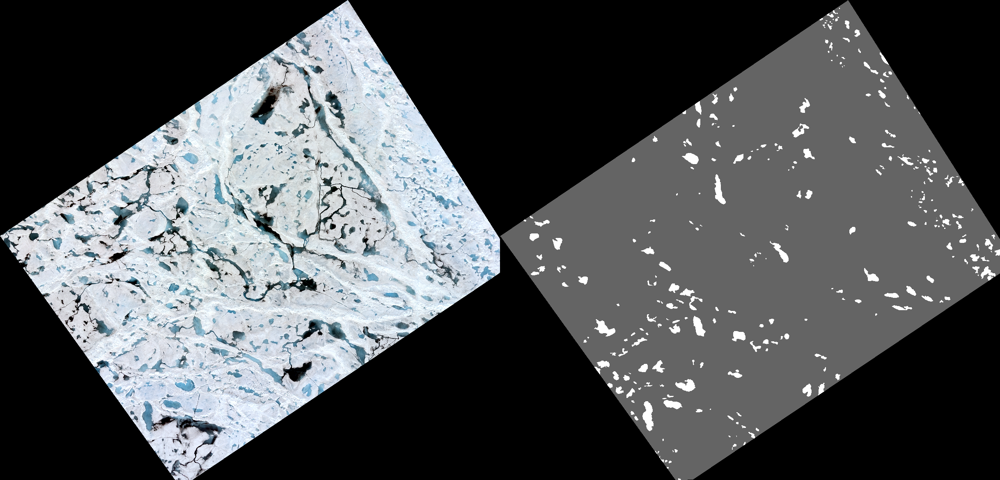

In [24]:
horizontal = np.hstack((img[:,:,0:3], grey_3_channel_mask))
cv2_imshow(horizontal)

In [25]:
def plot_images_and_labels(img, label):
  fig = plt.figure(figsize = (12, 4))
  
  ax1 = fig.add_subplot(131)
  ax1.imshow(img[:,:])
  ax1.set_title("Sea Ice")
  ax1.set_xticks([])
  ax1.set_yticks([])
  
  ax2 = fig.add_subplot(132)
  ax2.imshow(label[:,:])
  ax2.set_title("Label")
  ax2.set_xticks([])
  ax2.set_yticks([])
  
  dst = cv2.addWeighted(img, 0.5, label, 0.5, 0)
  
  ax3 = fig.add_subplot(133)
  ax3.imshow(dst[:,:])
  ax3.set_title("Blending")
  ax3.set_xticks([])
  ax3.set_yticks([])

We look to see how the blended image of the Sea Ice (using the first three channels) and the three-channel gray image blend.

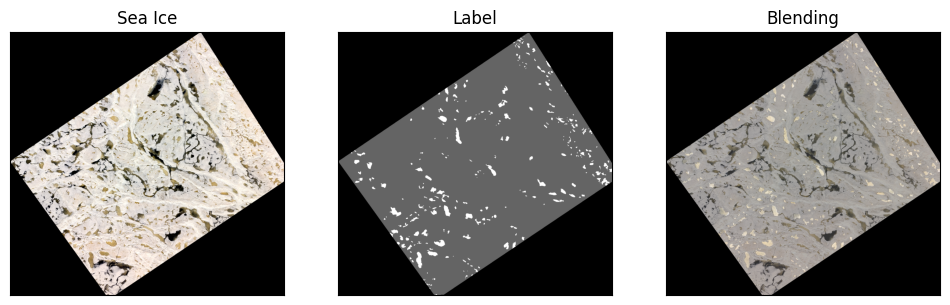

In [26]:
plot_images_and_labels(img[:,:, 0:3], grey_3_channel_mask)

We only have one image and one mask, so to improve results we tile the image to generate more training data.

In [27]:
!mkdir Tiles

In [28]:
cd Tiles

/content/Tiles


In [29]:
!mkdir images
!mkdir labels

In [30]:
cd ..

/content


In [31]:
ls

gdrive/  sample_data/  Tiles/


In [32]:
# break up large images into small squares:
start_no = 0
im_size = 256

if len(np.shape(img))==3:
  image = img[:,:,0]
if len(np.shape(grey_3_channel_mask))==3:
  lab = grey_3_channel_mask[:,:,0]

r, c = np.shape(image)
n_rows = int(np.floor(r/float(im_size)))
n_cols = int(np.floor(c/float(im_size)))

# write files for segmented images:
for i in trange(n_rows):
    for j in range(n_cols):
        im = image[i*im_size:(i+1)*im_size, j*im_size:(j+1)*im_size].astype('uint8')
        imname = 'Tiles/images/' + 'im%03d.png'%(start_no+n_cols*i+j)
        m = lab[i*im_size:(i+1)*im_size, j*im_size:(j+1)*im_size].astype('uint8')
        labname = 'Tiles/labels/' + 'im%03d.png'%(start_no+n_cols*i+j)
        
        # if np.max(m)>0: # only save images that have more than just background
        im = Image.fromarray(im.astype(np.uint8))
        im.save(imname)
        m = Image.fromarray(m.astype(np.uint8))
        m.save(labname)

start_no = start_no + n_rows*n_cols

100%|██████████| 4/4 [00:00<00:00, 42.53it/s]


In [33]:
from glob import glob
images = sorted(glob("Tiles/images/*.png"))
labels = sorted(glob("Tiles/labels/*.png")) 

In [34]:
for i in range(len(images)):
  print('img_tile: {} | label_tile: {}'.format(images[i], labels[i]))

img_tile: Tiles/images/im000.png | label_tile: Tiles/labels/im000.png
img_tile: Tiles/images/im001.png | label_tile: Tiles/labels/im001.png
img_tile: Tiles/images/im002.png | label_tile: Tiles/labels/im002.png
img_tile: Tiles/images/im003.png | label_tile: Tiles/labels/im003.png
img_tile: Tiles/images/im004.png | label_tile: Tiles/labels/im004.png
img_tile: Tiles/images/im005.png | label_tile: Tiles/labels/im005.png
img_tile: Tiles/images/im006.png | label_tile: Tiles/labels/im006.png
img_tile: Tiles/images/im007.png | label_tile: Tiles/labels/im007.png
img_tile: Tiles/images/im008.png | label_tile: Tiles/labels/im008.png
img_tile: Tiles/images/im009.png | label_tile: Tiles/labels/im009.png
img_tile: Tiles/images/im010.png | label_tile: Tiles/labels/im010.png
img_tile: Tiles/images/im011.png | label_tile: Tiles/labels/im011.png
img_tile: Tiles/images/im012.png | label_tile: Tiles/labels/im012.png
img_tile: Tiles/images/im013.png | label_tile: Tiles/labels/im013.png
img_tile: Tiles/imag

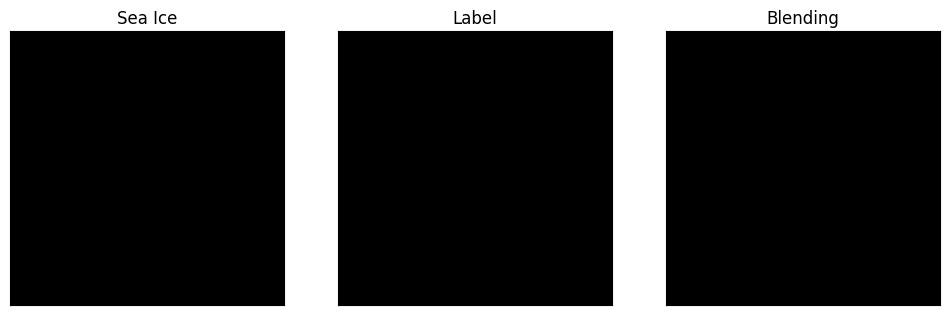

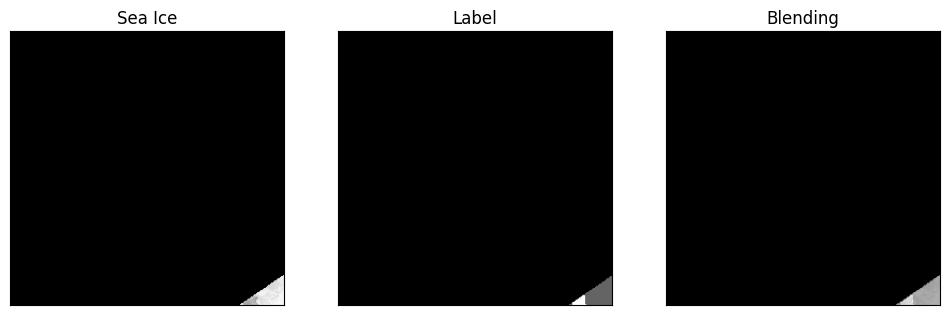

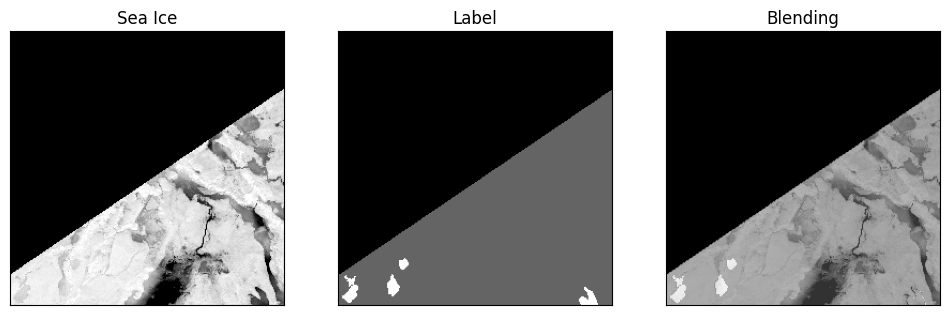

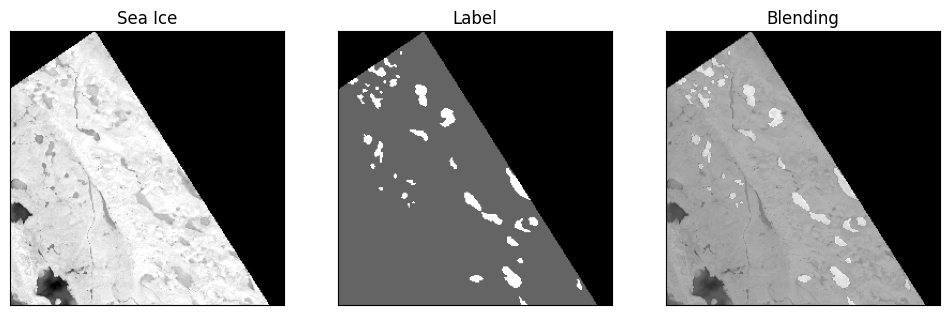

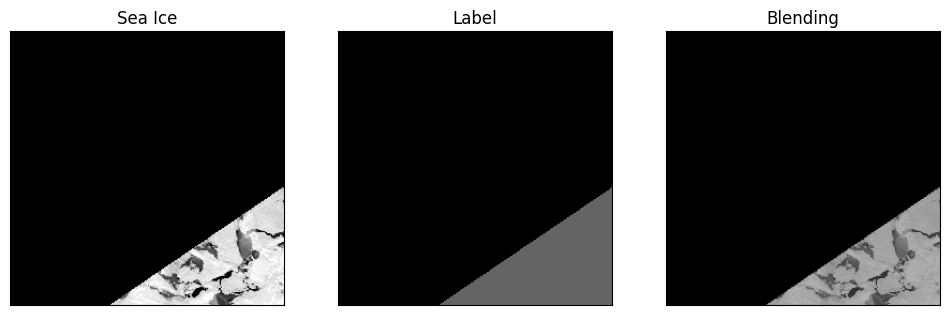

...

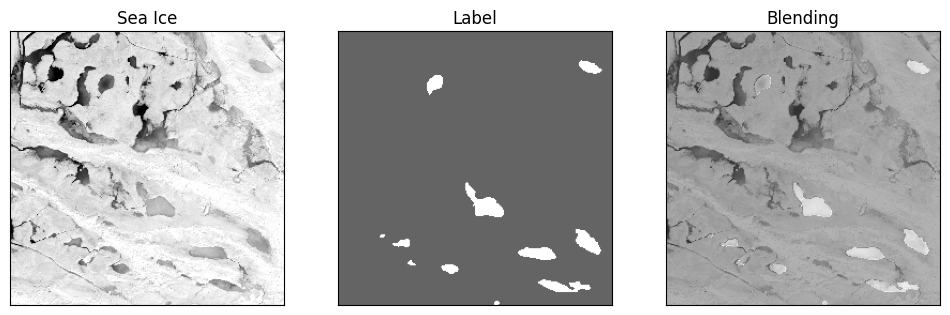

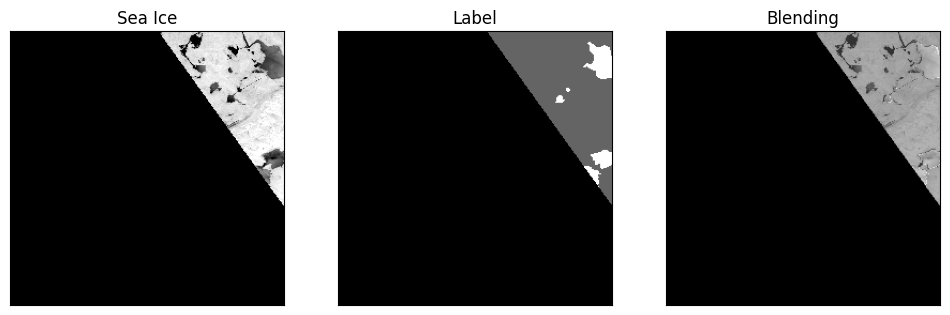

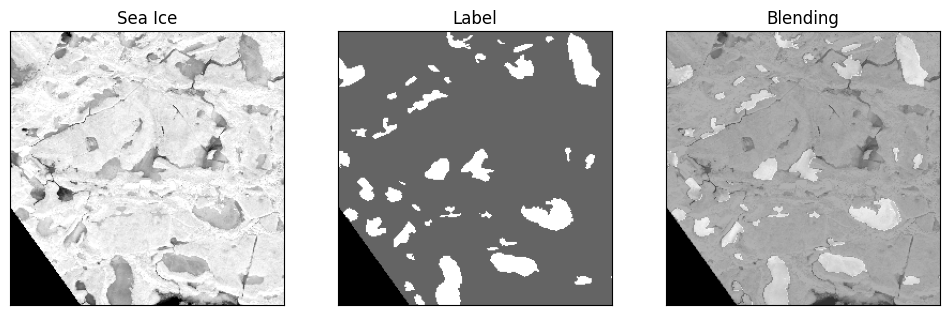

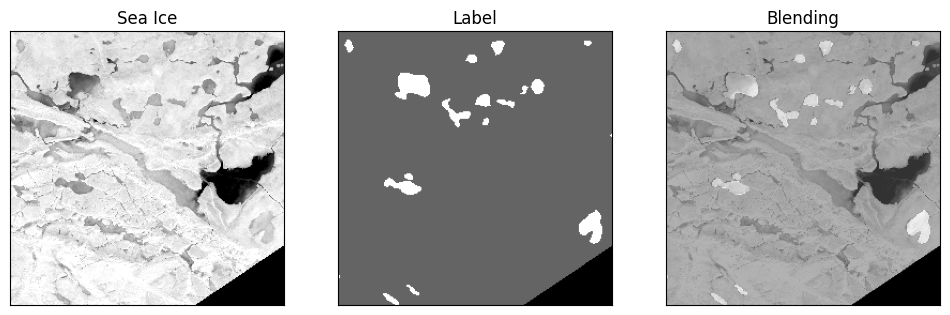

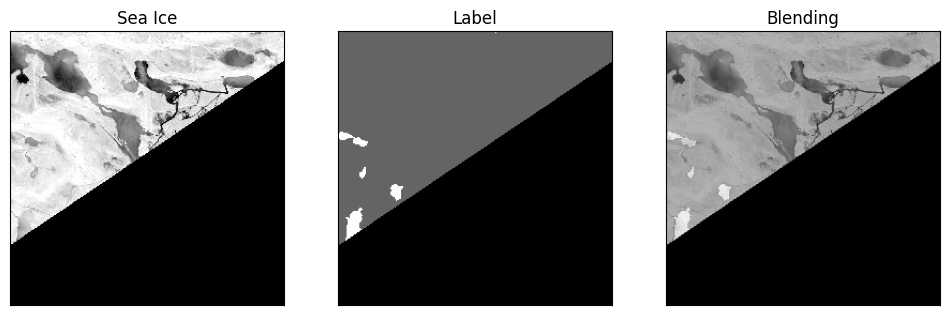

In [35]:
for i in range(len(images)):
  fname = images[i]
  tile = cv2.imread(fname)
  lab = cv2.imread(fname.replace('images', 'labels'))
  plot_images_and_labels(tile, lab)

We use image augmentation to enchance the number of training data we have.

In [36]:
!pip install clodsa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 36.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.2/276.2 kB 27.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for clodsa: filename=clodsa-1.2.48-py2.py3-none-any.whl size=74328 sha256=64a98fad856757468f6f336096098112e6019b434cae9e6b5bd1034a2b13e4f5
  Stored in directory: /root/.cache/pip/wheels/88/81/b1/76a6b831066b6d0610ac18e0d36d822eaefe4986dc81623795
  Created wheel for commentjson: filename=commentjson-0.9.0-py3-none-any.whl size=12097 sha256=64d975778c8addea396c0771c85e85f06de8ee4cdd3c18ddfef3ccb18e077c6f
  Stored in directory: /root/.cache/pip/wheels/ed/0e/3c/ef5ab146764cca41417bcd2493db4f72d8d8c658448317a3fe
  Created wheel for lark-parser: filename=lark_parser-0.7.8-py2.py3-none-any.whl size=625

In [38]:
pip install numpy --upgrade # this needs to be run twice for some reason??? Otherwise next cell won't work.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [40]:
from clodsa.augmentors.augmentorFactory import createAugmentor
from clodsa.transformers.transformerFactory import transformerGenerator
from clodsa.techniques.techniqueFactory import createTechnique

In [41]:
PROBLEM = "semantic_segmentation"
ANNOTATION_MODE = "folders"
INPUT_PATH = "/content/Tiles/"
GENERATION_MODE = "linear" # all the augmentation techniques are applied to all the images of the original dataset
OUTPUT_MODE = "folders"
OUTPUT_PATH= "/content/augmented_images2/"
LABELS_EXTENSION = ".png"

augmentor = createAugmentor(PROBLEM, ANNOTATION_MODE, OUTPUT_MODE, GENERATION_MODE, INPUT_PATH,{"outputPath":OUTPUT_PATH,"labelsExtension":LABELS_EXTENSION})

In [42]:
transformer = transformerGenerator(PROBLEM) # initialize a transformer

In [43]:
# rotate images
rot90 = createTechnique("rotate", {"angle" : 90})
augmentor.addTransformer(transformer(rot90))
rot180 = createTechnique("rotate", {"angle" : 180})
augmentor.addTransformer(transformer(rot180))
rot270 = createTechnique("rotate", {"angle" : 270})
augmentor.addTransformer(transformer(rot270))

In [44]:
gamma = createTechnique("gamma",{"gamma":1.5})
augmentor.addTransformer(transformer(gamma))

In [45]:
gamma1 = createTechnique("gamma",{"gamma":2.0})
augmentor.addTransformer(transformer(gamma1))

In [46]:
gamma2 = createTechnique("gamma",{"gamma":0.5})
augmentor.addTransformer(transformer(gamma2))

In [47]:
none = createTechnique("none",{}) # need to copy the original images as well!
augmentor.addTransformer(transformer(none))

In [48]:
fliph = createTechnique("flip",{"flip":1})
flipv = createTechnique("flip",{"flip":0})
augmentor.addTransformer(transformer(fliph))
augmentor.addTransformer(transformer(flipv))

In [49]:
# equalize histo
equalize = createTechnique("equalize_histogram", {})
augmentor.addTransformer(transformer(equalize))

In [50]:
salt_and_pepper = createTechnique("salt_and_pepper",{"low":0, 'high': 255})
augmentor.addTransformer(transformer(salt_and_pepper))

In [51]:
median = createTechnique("median_blur",{"kernel":3})
augmentor.addTransformer(transformer(median))

In [52]:
dropout = createTechnique("dropout",{"percentage":0.05})
augmentor.addTransformer(transformer(gamma2))

In [53]:
invert = createTechnique("invert",{})
augmentor.addTransformer(transformer(invert))

In [54]:
len(augmentor.transformers)

14

In [55]:
augmentor.applyAugmentation() # apply the augmentation; this takes a while

In [56]:
images = sorted(glob("/content/augmented_images2/images/*.png"))
labels = sorted(glob("/content/augmented_images2/labels/*.png")) 

In [57]:
len(images)

224

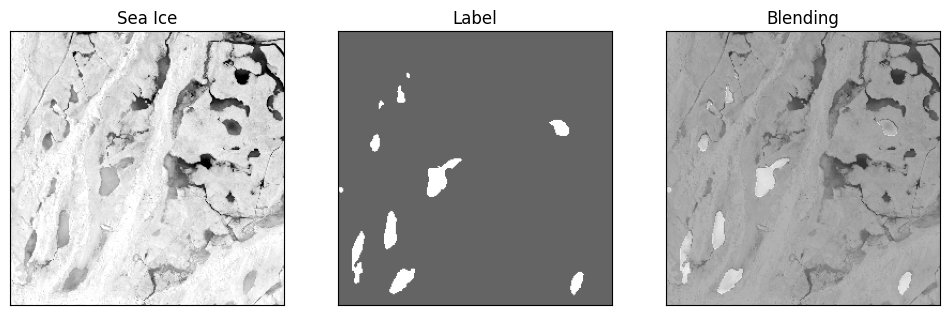

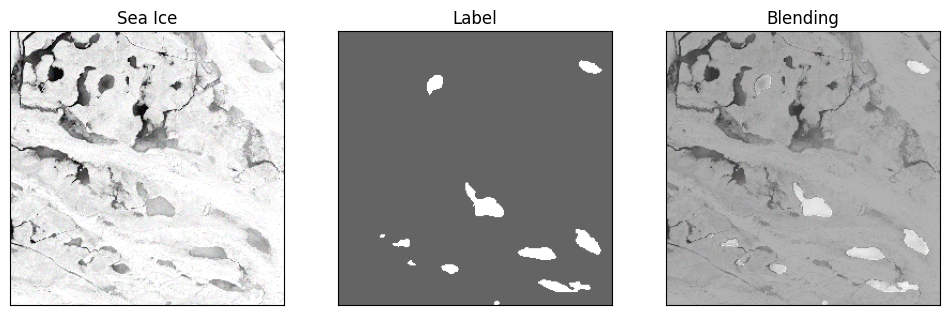

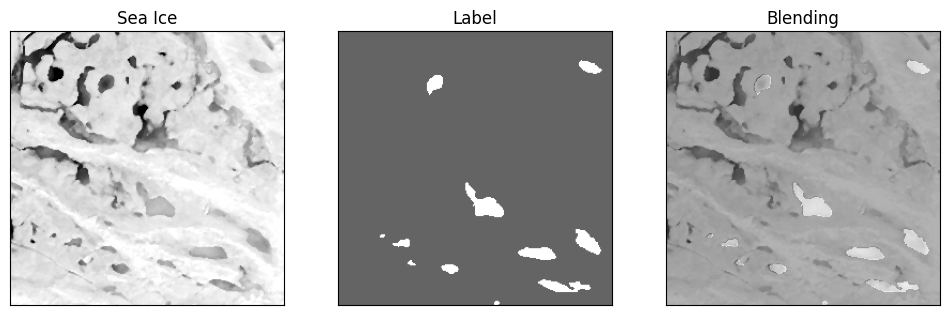

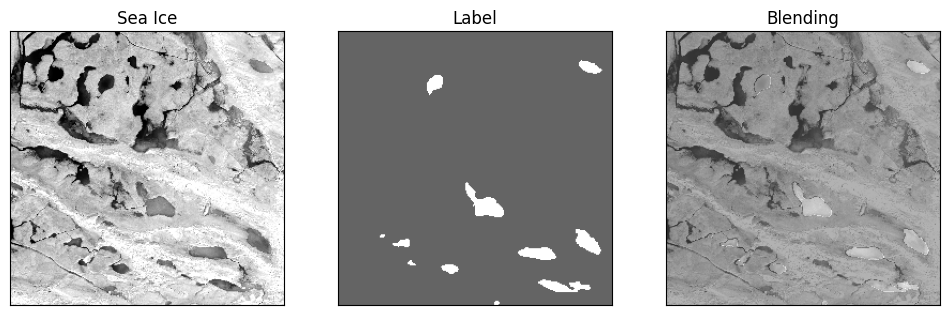

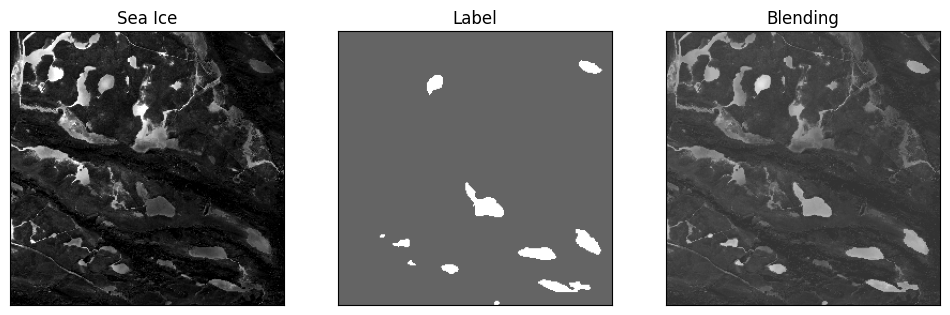

...

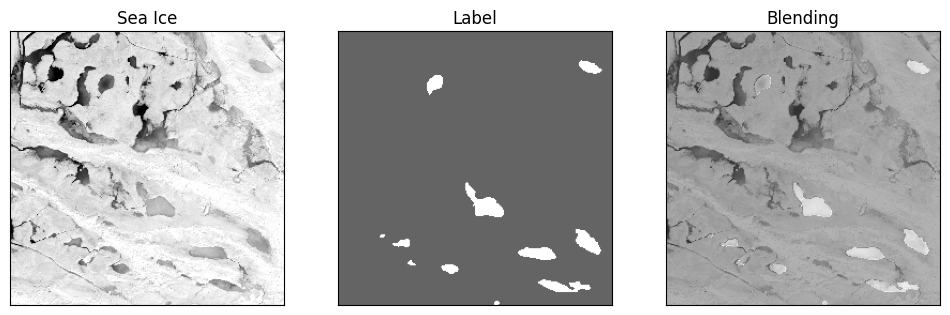

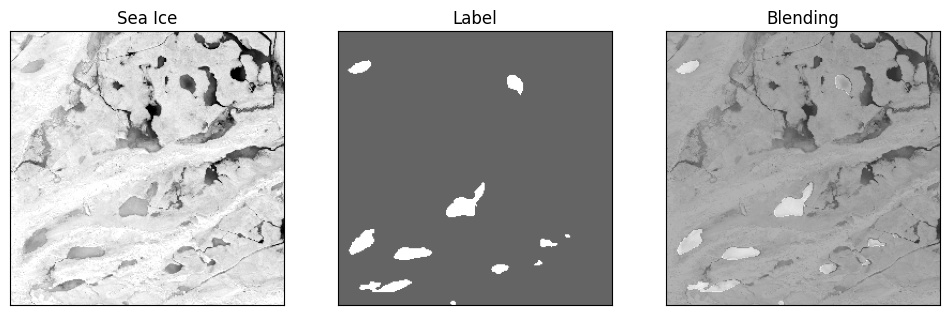

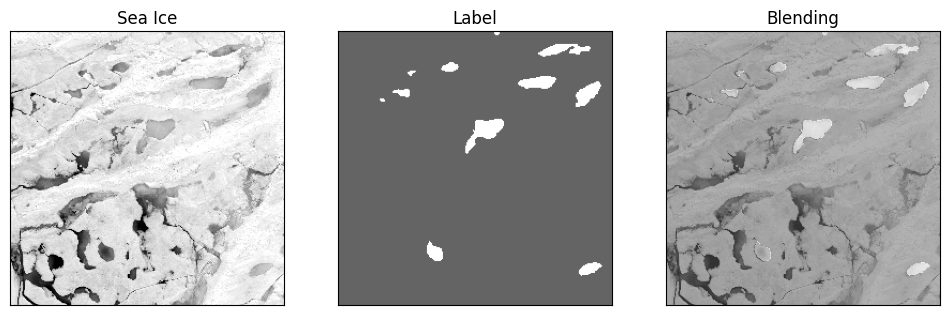

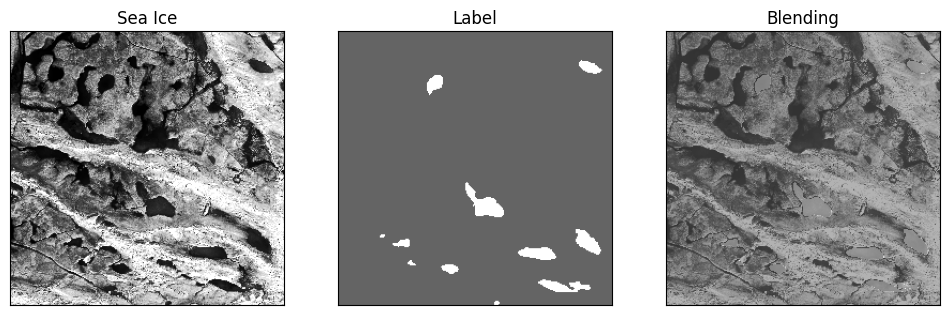

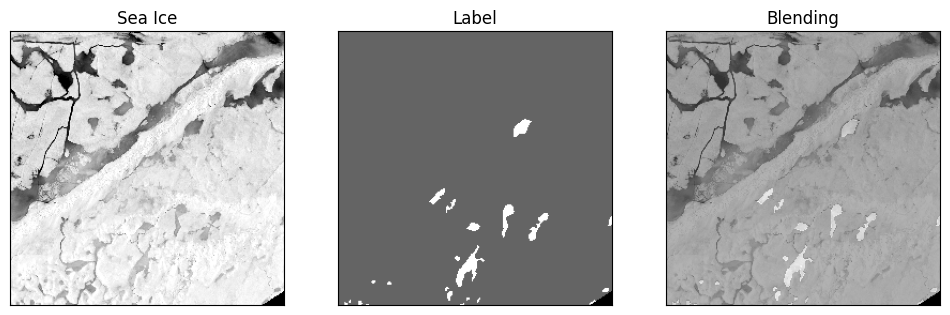

In [58]:
for i in range(15):
  fname = images[i]
  fname2 = labels[i]
  tile = cv2.imread(fname)
  lab = cv2.imread(fname2)
  plot_images_and_labels(tile, lab)

Now we start working on the model.

In [59]:
# split half into training
train_idx = np.random.choice(np.arange(len(images)), size = int(len(images)/2) , replace=False)

# get the rest
idx = np.setdiff1d(np.arange(len(images)), train_idx)

# get val files (25% of total)
val_idx = np.random.choice(idx, size = int(len(images)/4) , replace=False)

# get test files (25% of total)
test_idx = np.setdiff1d(val_idx, train_idx)

In [72]:
def image_batch_generator(files, im_size, batch_size = 8):
  
  while True: # this is here because it will be called repeatedly by the training function
    
    # extract a random subset of files of length "batch_size"
    batch = np.random.choice(files, size = batch_size)    
    
    # variables for collecting batches of inputs (x) and outputs (y)
    batch_x = []
    batch_y = []
    
    #cycle through each image in the batch
    for f in batch:
        # open the image and resize
        image = np.array(Image.open(f))
        image = image[:,:,0]/255.0 # scale input image to (0, 1)
        image = np.expand_dims(image,2)
        batch_x.append(image) 

        # open label image by string substitution
        mask = np.array(Image.open(f.replace('/images/','/labels/')))
        mask = mask[:,:,0]
        temp = np.zeros((im_size, im_size, 3)) # create expanded target with channels for 3 classes
        temp[:,:,0][mask==0] = 1 # no data
        temp[:,:,1][mask==100] = 1 # ice
        temp[:,:,2][mask==255] = 1 # pond
        mask = temp
        batch_y.append(mask)

    # turn into numpy arrays
    batch_x = np.array(batch_x) 
    batch_y = np.array(batch_y)

    yield (batch_x, batch_y) #yield both the image and the label together

In [73]:
gen = image_batch_generator(images, im_size = 256, batch_size = 8)

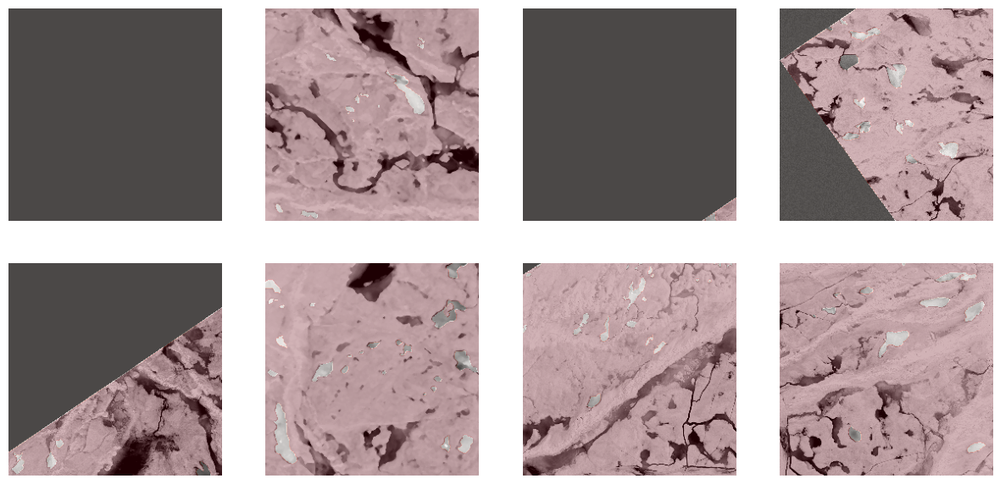

In [74]:
x1, y1 = next(gen)

plt.figure(figsize=(15,15))

counter = 0
for k in range(8):
  plt.subplot(4,4,counter+1)
  plt.imshow(x1[counter][:,:,0],  cmap=plt.cm.gray)
  plt.imshow(y1[counter][:,:,1], alpha=0.3, cmap=plt.cm.Reds)
  plt.axis('off')
  counter += 1

In [75]:
np.shape(x1[0]) # image

(256, 256, 1)

In [76]:
np.shape(y1[0]) # label

(256, 256, 3)

In [77]:
# create arrays of training, validation, and test files (these are filenames)
train_files = np.array(images)[train_idx]
val_files = np.array(images)[val_idx]
test_files = np.array(images)[test_idx]

In [78]:
train_files[:5]

array(['/content/augmented_images2/images/5_4_im010.png',
       '/content/augmented_images2/images/8_13_im014.png',
       '/content/augmented_images2/images/5_1_im010.png',
       '/content/augmented_images2/images/10_8_im007.png',
       '/content/augmented_images2/images/5_13_im010.png'], dtype='<U49')

In [81]:
im_size = 256
batch_size = 8

train_generator = image_batch_generator(train_files, im_size, batch_size = batch_size) # call the batch generator for train set
val_generator  = image_batch_generator(val_files, im_size, batch_size = batch_size) # call batch generator validation set

train_steps = len(train_files)//batch_size # number of steps per training epoch
val_steps = len(val_files)//batch_size # number of steps per validation epoch

print(train_steps)
print(val_steps)

14
7


In [82]:
np.unique(y1[2][:,:,1])

array([0., 1.])

In [83]:
# get an idea about class balance
nodata_fractions = []
pond_fractions = []
nonpond_fractions = []

count = 0

while count < 100:
  x1, y1 = next(gen)
  
  for i in range(8):
    nonpond_fraction = len(np.where(y1[i][:,:,2]==1)[0])/(256**2)
    
    pond_fraction = len(np.where(y1[i][:,:,1]==1)[0])/(256**2)
    pond_fractions.append(pond_fraction)
    
    nonpond_fractions.append(nonpond_fraction)
    nodata_fractions.append(1 - pond_fraction - nonpond_fraction)
  
  count += 1 

In [84]:
print(1/(3*np.mean(nodata_fractions)), 1/(3*np.mean(pond_fractions)), 1/(3*np.mean(nonpond_fractions)))
# background, pond, non-pond

0.9453984808759434 0.5379330483238688 12.008035467459495


In [85]:
def weighted_crossentropy(y_true, y_pred):
    class_weights = tf.constant([[[[1.37, 6.38, 0.47]]]]) # increase the weight on the grains and the grain boundaries
    unweighted_losses = tf.nn.softmax_cross_entropy_with_logits(labels=y_true, logits=y_pred)
    weights = tf.reduce_sum(class_weights * y_true, axis=-1) # sum of weights
    weighted_losses = weights * unweighted_losses # weighted losses
    loss = tf.reduce_mean(weighted_losses) # mean loss
    return loss

In [86]:
def Unet():
    tf.keras.backend.clear_session()

    image = tf.keras.Input((256,256,1),name='input')

    conv1 = Conv2D(16, (3,3), activation='relu', padding = 'same')(image)
    conv1 = BatchNormalization()(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(32, (3,3), activation='relu', padding = 'same')(pool1)
    conv2 = BatchNormalization()(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64, (3,3), activation='relu', padding = 'same')(pool2)
    conv3 = BatchNormalization()(conv3)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(128, (3,3), activation='relu', padding = 'same')(pool3)
    conv4 = BatchNormalization()(conv4)

    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(256, (3,3), activation='relu', padding = 'same')(pool4)
    conv5 = BatchNormalization()(conv5)

    up6 = Conv2DTranspose(128, (3, 3), strides = (2, 2), padding = 'same')(conv5)
    up6 = concatenate([up6, conv4])
    conv6 = Conv2D(128, (3,3), activation='relu', padding = 'same')(up6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2DTranspose(64, (3, 3), strides = (2, 2), padding = 'same')(conv6)
    up7 = concatenate([up7, conv3])
    conv7 = Conv2D(64, (3,3), activation='relu', padding = 'same')(up7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2DTranspose(32, (3, 3), strides = (2, 2), padding = 'same')(conv7)
    up8 = concatenate([up8, conv2])
    conv8 = Conv2D(32, (3,3), activation='relu', padding = 'same')(up8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2DTranspose(16, (3, 3), strides = (2, 2), padding = 'same')(conv8)
    up9 = concatenate([up9, conv1])
    conv9 = Conv2D(16, (3,3), activation='relu', padding = 'same')(up9)
    conv9 = BatchNormalization()(conv9)

    conv10 = Conv2D(3, (1,1), activation='softmax')(conv9)
    model = Model(inputs=[image], outputs=[conv10])

    return model

In [87]:
model = Unet()
loss = weighted_crossentropy
model.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [88]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  160         ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

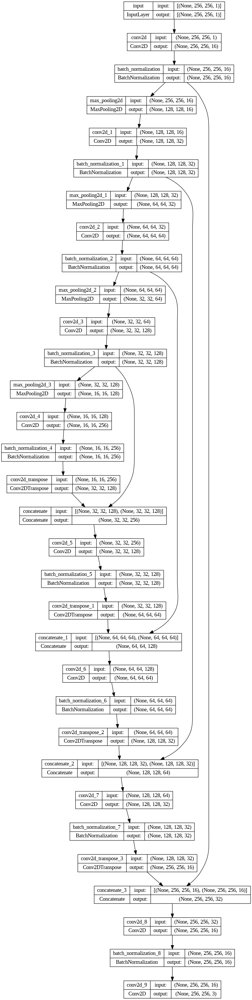

In [89]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [90]:
callbacks = [
    EarlyStopping(patience=5, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_1.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [91]:
results = model.fit(train_generator, 
                epochs = 100, steps_per_epoch = train_steps,
                validation_data = val_generator, validation_steps = val_steps,
                callbacks = callbacks)	

Epoch 1/100
14/14 [==============================] - ETA: 0s - loss: 4.2205 - accuracy: 0.7119
Epoch 1: val_loss improved from inf to 4.65260, saving model to model_1.h5
14/14 [==============================] - 87s 6s/step - loss: 4.2205 - accuracy: 0.7119 - val_loss: 4.6526 - val_accuracy: 0.3088 - lr: 0.0010
Epoch 2/100
14/14 [==============================] - ETA: 0s - loss: 3.2004 - accuracy: 0.9077
Epoch 2: val_loss improved from 4.65260 to 3.42288, saving model to model_1.h5
14/14 [==============================] - 79s 6s/step - loss: 3.2004 - accuracy: 0.9077 - val_loss: 3.4229 - val_accuracy: 0.5073 - lr: 0.0010
Epoch 3/100
14/14 [==============================] - ETA: 0s - loss: 3.0062 - accuracy: 0.9229
Epoch 3: val_loss improved from 3.42288 to 2.86434, saving model to model_1.h5
14/14 [==============================] - 79s 6s/step - loss: 3.0062 - accuracy: 0.9229 - val_loss: 2.8643 - val_accuracy: 0.5160 - lr: 0.0010
Epoch 4/100
14/14 [==============================] - ETA

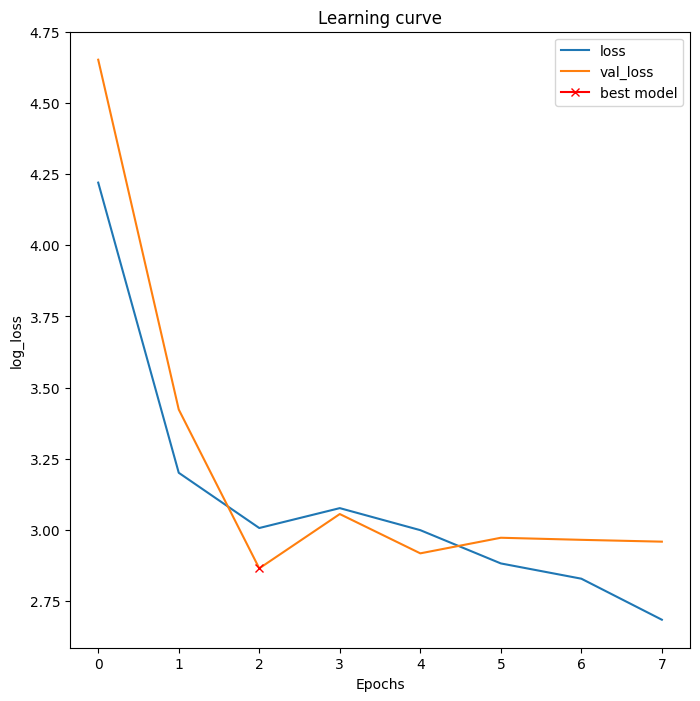

In [92]:
# with batch normalization
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

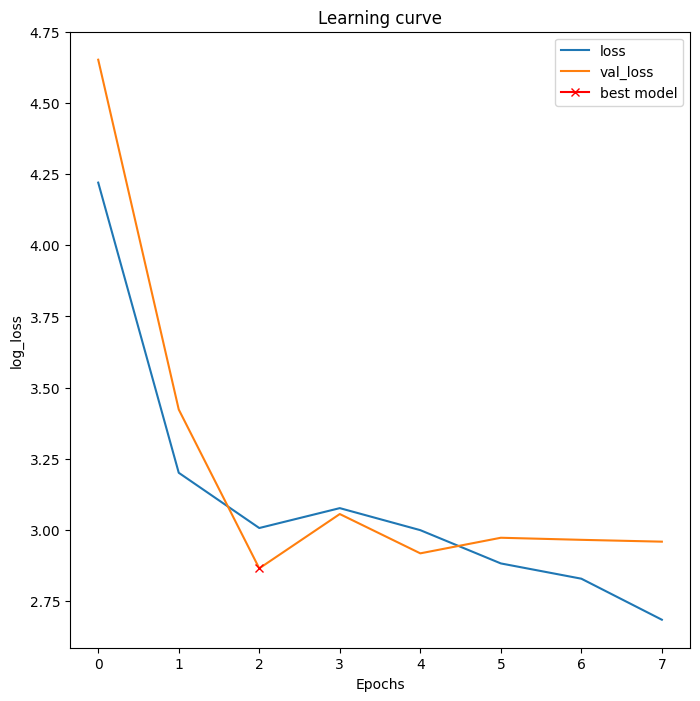

In [93]:
# without batch normalization
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

In [94]:
# load the best model
model=Unet()
model.load_weights('model_1.h5')
loss = weighted_crossentropy
model.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [95]:
test_generator = image_batch_generator(test_files, im_size, batch_size = batch_size)
print("# test files: %i" % (len(test_files)))
# some other training parameters
steps = len(test_files) // batch_size
# testing
scores = model.evaluate(test_generator, steps=steps) 

# test files: 56
7/7 [==============================] - 11s 2s/step - loss: 3.0165 - accuracy: 0.6041


In [96]:
print(model.metrics_names)
print(scores)

['loss', 'accuracy']
[3.0164990425109863, 0.6040581464767456]
